In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/0f72db9c-d635-4415-9781-68937328aed2___NREC_B.Spot 9188.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/1b8d3e98-43d9-441d-93ef-a359e6e9ddc2___NREC_B.Spot 9052.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/b6d35d21-4812-4e32-ab9a-b6ddda8cbb79___JR_B.Spot 8972.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/e4e7e5a2-5aa1-4378-833d-9142358c7c9b___JR_B.Spot 9092.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/8b50f2db-cbf2-4758-bea6-a011f0cc1497___JR_B.Spot 3235.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/729b55d7-2a99-4861-910d-3b4e2bbce1

In [1]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, Sequential
import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import keras 
from keras.callbacks import EarlyStopping,ModelCheckpoint
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm

In [9]:
def data(dataset_path):
    images = []
    labels = []
    for subfolder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, subfolder)
        for image_filename in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, image_filename)
            images.append(image_path)
            labels.append(subfolder)
    return pd.DataFrame({'image': images, 'label': labels})

In [10]:
dataset_path = '/kaggle/input/plantvillage-dataset/color'
data_df = data(dataset_path)

In [24]:
X_train, X_test1, y_train, y_test1 = train_test_split(
    data_df['image'], data_df['label'], test_size=0.2, random_state=42, stratify=data_df['label']
)
X_val, X_test, y_val, y_test = train_test_split(
    X_test1, y_test1, test_size=0.5, random_state=42, stratify=y_test1
)


In [ ]:
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})


In [38]:
df_train['label'] = pd.Categorical(df_train['label']).codes
df_val['label'] = pd.Categorical(df_val['label']).codes
df_test['label'] = pd.Categorical(df_test['label']).codes
# Encode labels to strings for compatibility with class_mode='categorical'
df_train['label'] = pd.Categorical(df_train['label']).categories[df_train['label']].astype(str)
df_val['label'] = pd.Categorical(df_val['label']).categories[df_val['label']].astype(str)
df_test['label'] = pd.Categorical(df_test['label']).categories[df_test['label']].astype(str)

In [ ]:
image_size = (224, 224)
batch_size = 32

In [25]:
datagen = ImageDataGenerator(rescale=1./255)
train_datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True
)

In [47]:
train_generator = train_datagen.flow_from_dataframe(
    df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

val_generator = datagen.flow_from_dataframe(
    df_val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_generator = datagen.flow_from_dataframe(
    df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

Found 43444 validated image filenames belonging to 38 classes.
Found 5430 validated image filenames belonging to 38 classes.
Found 5431 validated image filenames belonging to 38 classes.


In [28]:
df_train.label.value_counts().to_frame()

,count
label,
15,4405
35,4286
24,4072
16,1837
28,1702
30,1527
25,1468
32,1417
33,1341


In [29]:
class ResNetBlock(Layer):
    def __init__(self, out_channels, first_stride=1):
        super().__init__()
        self.conv_sequence = Sequential([
            Conv2D(out_channels, 3, strides=first_stride, padding='same', kernel_initializer='he_normal'),
            BatchNormalization(),
            ReLU(),
            Conv2D(out_channels, 3, strides=1, padding='same', kernel_initializer='he_normal'),
            BatchNormalization()
        ])
        
        self.shortcut = Sequential([
            Conv2D(out_channels, 1, strides=first_stride, padding='same', kernel_initializer='he_normal'),
            BatchNormalization()
        ]) if first_stride != 1 else None

    def call(self, inputs):
        shortcut = self.shortcut(inputs) if self.shortcut else inputs
        x = self.conv_sequence(inputs)
        x = x + shortcut
        return tf.nn.relu(x)

In [30]:
class ResNet(Model):
    def __init__(self, block_config=(2, 2, 2, 2), num_classes=1):
        super(ResNet, self).__init__()
        
        # Initial convolution and pooling layers
        self.conv_1 = Sequential([
            Conv2D(64, 7, 2, padding='same', kernel_initializer='he_normal'),
            BatchNormalization(),
            ReLU(),
            MaxPooling2D(3, 2, padding='same')
        ])

        channels = [64, 128, 256, 512]  # Number of channels for each block stage
        self.resnet_chains = Sequential()
        for i, num_blocks in enumerate(block_config):
            for j in range(num_blocks):
                stride = 2 if j == 0 and i > 0 else 1
                self.resnet_chains.add(ResNetBlock(channels[i], first_stride=stride))

        # Final layers
        self.out = Sequential([
            GlobalAveragePooling2D(),
            Dense(num_classes, activation='softmax')  # Softmax for multi-class classification
        ])

    def call(self, x):
        x = self.conv_1(x)
        x = self.resnet_chains(x)
        x = self.out(x)
        return x

In [40]:
num_classes = len(train_generator.class_indices)
model = ResNet(num_classes=num_classes)

model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC()]
)

In [41]:
EPOCHS = 20
with tf.device('/GPU:0'):
    history = model.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator,
    )

Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1734099011.788542     245 service.cc:145] XLA service 0x7a2fa00087c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734099011.788635     245 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1734099011.788646     245 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


   1/1358 ━━━━━━━━━━━━━━━━━━━━ 8:33:34 23s/step - accuracy: 0.0000e+00 - auc_2: 0.5372 - loss: 22.1391

I0000 00:00:1734099022.450351     245 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 338s 232ms/step - accuracy: 0.2557 - auc_2: 0.8066 - loss: 3.6991 - val_accuracy: 0.7101 - val_auc_2: 0.9856 - val_loss: 0.9088
Epoch 2/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 155s 114ms/step - accuracy: 0.7463 - auc_2: 0.9860 - loss: 0.8085 - val_accuracy: 0.8536 - val_auc_2: 0.9945 - val_loss: 0.4324
Epoch 3/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 154s 113ms/step - accuracy: 0.8503 - auc_2: 0.9941 - loss: 0.4587 - val_accuracy: 0.8818 - val_auc_2: 0.9955 - val_loss: 0.3493
Epoch 4/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 154s 113ms/step - accuracy: 0.8851 - auc_2: 0.9957 - loss: 0.3503 - val_accuracy: 0.8967 - val_auc_2: 0.9974 - val_loss: 0.3154
Epoch 5/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 154s 113ms/step - accuracy: 0.9126 - auc_2: 0.9974 - loss: 0.2607 - val_accuracy: 0.9221 - val_auc_2: 0.9958 - val_loss: 0.2538
Epoch 6/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 153s 112ms/step - accuracy: 0.9280 - auc_2: 0.9976 - loss: 0.2194 - val_accuracy: 0.9070 - val_auc_2: 0.9956 - val_loss

In [42]:
hist_=pd.DataFrame(history.history)
hist_

,accuracy,auc_2,loss,val_accuracy,val_auc_2,val_loss
0,0.431245,0.914159,2.162956,0.710129,0.985586,0.908804
1,0.774054,0.988690,0.712681,0.853591,0.994461,0.432405
2,0.855976,0.994456,0.439945,0.881768,0.995536,0.349290
3,0.889375,0.996070,0.335333,0.896685,0.997369,0.315431
4,0.914971,0.997231,0.257061,0.922099,0.995821,0.253791
5,0.927608,0.997534,0.219294,0.906998,0.995583,0.292307
6,0.938864,0.998028,0.184833,0.924862,0.997100,0.223639
7,0.948209,0.998209,0.160460,0.933333,0.996903,0.217619
8,0.951225,0.998622,0.142381,0.936832,0.997399,0.192846
9,0.959465,0.998853,0.118080,0.939779,0.996883,0.196758


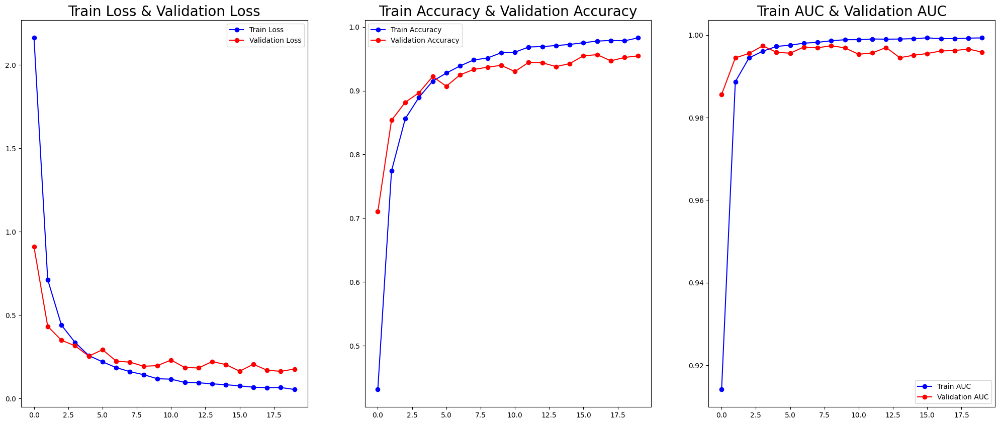

In [44]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 3, 1)
plt.plot(hist_['loss'], 'b-o', label='Train Loss')
plt.plot(hist_['val_loss'], 'r-o', label='Validation Loss')
plt.title('Train Loss & Validation Loss', fontsize=20)
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(hist_['accuracy'], 'b-o', label='Train Accuracy')
plt.plot(hist_['val_accuracy'], 'r-o', label='Validation Accuracy')
plt.title('Train Accuracy & Validation Accuracy', fontsize=20)
plt.legend()

if 'auc_2' in hist_.columns and 'val_auc_2' in hist_.columns:
    plt.subplot(1, 3, 3)
    plt.plot(hist_['auc_2'], 'b-o', label='Train AUC')
    plt.plot(hist_['val_auc_2'], 'r-o', label='Validation AUC')
    plt.title('Train AUC & Validation AUC', fontsize=20)
    plt.legend()

plt.show()


In [48]:
# After training, evaluate the model on the test data
test_loss, test_accuracy, test_auc = model.evaluate(test_generator)

# Print the test results
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")
print(f"Test AUC: {test_auc}")


  1/170 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - accuracy: 0.9062 - auc_2: 0.9683 - loss: 0.8773

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


170/170 ━━━━━━━━━━━━━━━━━━━━ 33s 195ms/step - accuracy: 0.9449 - auc_2: 0.9942 - loss: 0.2288
Test Loss: 0.19821710884571075
Test Accuracy: 0.9462345838546753
Test AUC: 0.9955381155014038


170/170 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step
F1 Score (Micro Average): 0.9462


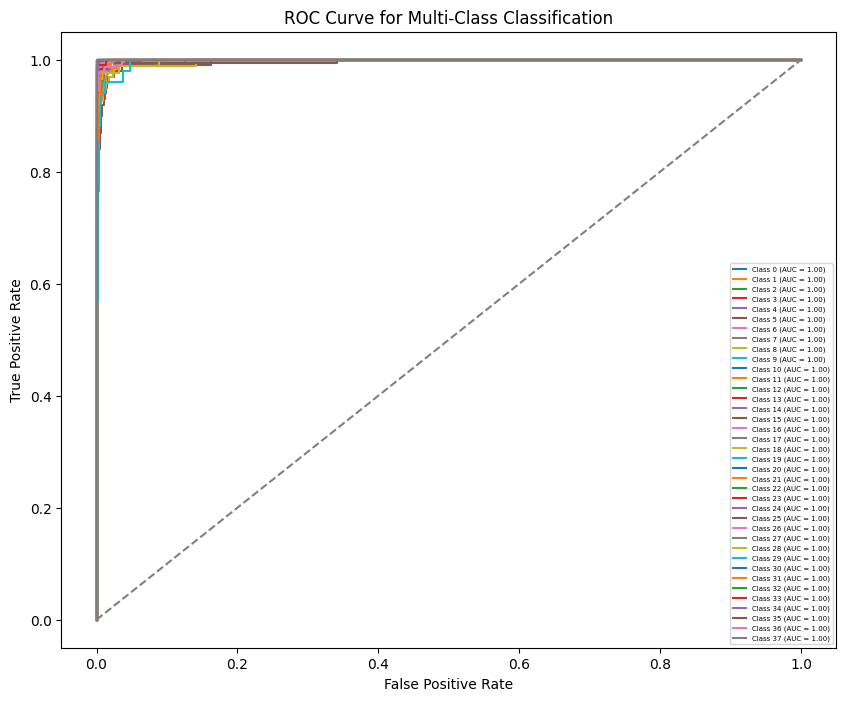


Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.86      0.86        63
           1       0.97      0.97      0.97        62
          10       0.92      0.89      0.90        99
          11       0.98      0.99      0.98       148
          12       0.95      0.70      0.81        27
          13       0.95      0.96      0.96       100
          14       0.81      0.96      0.88       100
          15       0.81      0.87      0.84        15
          16       0.97      0.92      0.94        37
          17       0.98      1.00      0.99       509
          18       0.99      0.97      0.98       184
          19       0.93      0.96      0.95       111
           2       0.99      1.00      1.00       116
          20       0.96      1.00      0.98        45
          21       0.97      0.90      0.93       213
          22       0.89      0.74      0.81       100
          23       0.98      0.90      0.94       165
   

In [55]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import roc_curve, auc, f1_score, classification_report
from sklearn.preprocessing import label_binarize

# Get true labels and predicted probabilities
y_true = test_generator.classes  # True class indices
y_pred = model.predict(test_generator)  # Predicted probabilities

# For multi-class classification, convert true labels to one-hot encoding
y_true_one_hot = label_binarize(y_true, classes=np.arange(len(test_generator.class_indices)))

# Calculate F1 Score (micro average for multi-class)
y_pred_classes = np.argmax(y_pred, axis=1)  # Predicted class indices
f1 = f1_score(y_true, y_pred_classes, average='micro')  # Micro average F1 score
print(f"F1 Score (Micro Average): {f1:.4f}")

# ROC Curve for multi-class classification (one-vs-rest)
fpr, tpr, roc_auc = {}, {}, {}
for i in range(len(test_generator.class_indices)):
    fpr[i], tpr[i], _ = roc_curve(y_true_one_hot[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve
plt.figure(figsize=(10, 8))
for i in range(len(test_generator.class_indices)):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

# Plot the diagonal (random classifier)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('ROC Curve for Multi-Class Classification')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(fontsize=5)
plt.show()

# Print Classification Report with Precision, Recall, and F1 Score for each class
print("\nClassification Report:")
report = classification_report(y_true, y_pred_classes, target_names=list(test_generator.class_indices.keys()))
print(report)


170/170 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step


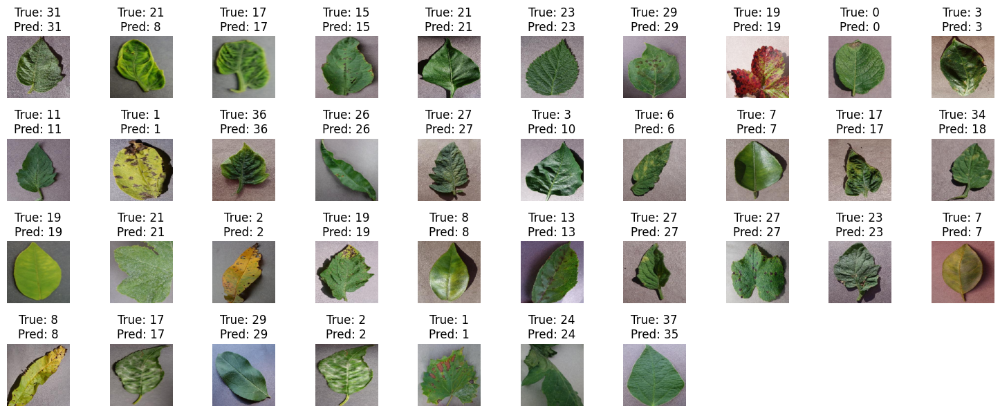

In [57]:
import matplotlib.pyplot as plt
import numpy as np

# Get the class indices mapping
class_indices = {v: k for k, v in test_generator.class_indices.items()}  # Reverse the mapping

# Predict on the test set
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)  # Predicted class indices
y_true_classes = test_generator.classes  # True class indices

# Display 9 images with their true and predicted labels
plt.figure(figsize=(15, 15))
for i in range(37):
    # Get a batch of data
    img, label = test_generator[i]
    
    # Select the first image from the batch
    image = img[0]
    true_label = class_indices[y_true_classes[i]]
    pred_label = class_indices[y_pred_classes[i]]

    # Plot the image
    plt.subplot(10, 10, i + 1)
    plt.imshow(image)
    plt.title(f"True: {true_label}\nPred: {pred_label}")
    plt.axis('off')

plt.tight_layout()
plt.show()


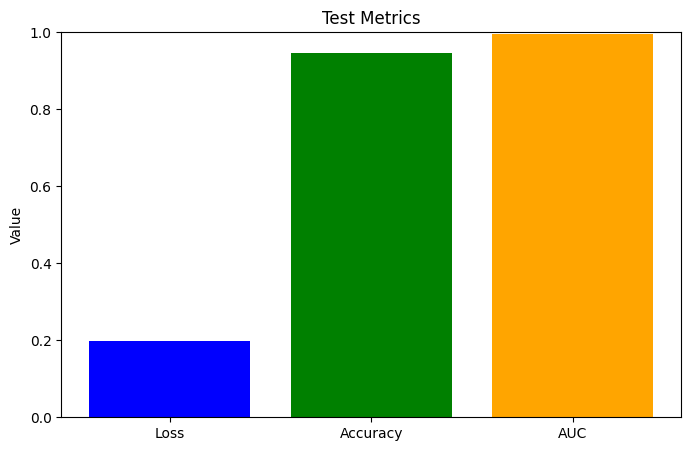

In [61]:
# Visualize test metrics
metrics = ['Loss', 'Accuracy', 'AUC']
values = [test_loss, test_accuracy, test_auc]

plt.figure(figsize=(8, 5))
plt.bar(metrics, values, color=['blue', 'green', 'orange'])
plt.title('Test Metrics')
plt.ylim(0, 1)
plt.ylabel('Value')
plt.show()
